# Compile CSVs exported from the GlaSEE pipeline

__NOTE:__ You must do one of the following to access your CSVs

- Upload this notebook to your Google Drive and run as a Colab notebook.

- Download the CSVs locally.

- Download Google Drive Desktop or other software for mounting your Drive locally.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from glob import glob
import os
import seaborn as sns
import datetime
import numpy as np

## Define path to files

In [ ]:
# If using Google Colab, mount your Drive
from google.colab import drive
drive.mount('/content/drive')

# Define to the Google Drive folder with exported CSV files
export_path = '/content/drive/My Drive/snow-mapping/'
out_path = '/content/drive/My Drive/snow-mapping/site-CSVs'
mv_path = '/content/drive/My Drive/snow-mapping/raw-CSVs' # optional: path where you want to move the raw CSVs

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Compile CSVs

In [ ]:
# -----Option 1: enter glacier IDs manually
# May be desired if some are glaciers still exporting, etc.
# glacier_IDs = ['RGI2000-v7.0-G-01-05299']

# -----Option 2: Grab all the glacier IDs in the folder
all_files = glob(os.path.join(export_path, '*.csv'))
ids = []
for file in all_files:
  id = file.split('/')[-1].split('_')[0] # os.path.basename(file).split('_')[0][18:]
  ids.append(id)
glacier_IDs = list(set(ids))
glacier_IDs.sort()
glacier_IDs

print('Number of unique glacier IDs:', len(glacier_IDs))
print(glacier_IDs)

Number of unique glacier IDs: 177
['RGI2000-v7.0-G-01-00351', 'RGI2000-v7.0-G-01-01042', 'RGI2000-v7.0-G-01-01051', 'RGI2000-v7.0-G-01-01103', 'RGI2000-v7.0-G-01-01414', 'RGI2000-v7.0-G-01-01443', 'RGI2000-v7.0-G-01-01487', 'RGI2000-v7.0-G-01-01495', 'RGI2000-v7.0-G-01-01546', 'RGI2000-v7.0-G-01-01607', 'RGI2000-v7.0-G-01-01664', 'RGI2000-v7.0-G-01-01709', 'RGI2000-v7.0-G-01-01751', 'RGI2000-v7.0-G-01-01811', 'RGI2000-v7.0-G-01-02411', 'RGI2000-v7.0-G-01-02443', 'RGI2000-v7.0-G-01-03418', 'RGI2000-v7.0-G-01-04313', 'RGI2000-v7.0-G-01-04634', 'RGI2000-v7.0-G-01-04665', 'RGI2000-v7.0-G-01-04673', 'RGI2000-v7.0-G-01-04675', 'RGI2000-v7.0-G-01-04706', 'RGI2000-v7.0-G-01-04720', 'RGI2000-v7.0-G-01-04732', 'RGI2000-v7.0-G-01-04764', 'RGI2000-v7.0-G-01-04766', 'RGI2000-v7.0-G-01-04779', 'RGI2000-v7.0-G-01-04816', 'RGI2000-v7.0-G-01-04825', 'RGI2000-v7.0-G-01-04927', 'RGI2000-v7.0-G-01-04942', 'RGI2000-v7.0-G-01-04948', 'RGI2000-v7.0-G-01-05020', 'RGI2000-v7.0-G-01-05021', 'RGI2000-v7.0-G-01-0

In [ ]:
# #ONLY NEEDED TO REMOVE FILES THAT WERE GENERATED DURING TESTING AND HAVE A UNIQUE SUFFIX (here '_5percsnow')

# for glacier_ID in glacier_IDs:
#   files = glob(os.path.join(export_path, glacier_ID + '*snow_cover_stats*.csv'))
#   for file in files:
#     if '_5percsnow' in file:
#       os.remove(file)
#       # print('file removed')

In [ ]:
# ONLY NEEDED IF YOU RERAN SITE-DATE PAIRS: Remove older versions of files
# glacier_ID = glacier_IDs[0] #specify an individual site
for glacier_ID in glacier_IDs: #iterate over all glacier_IDs
  print('\n', glacier_ID)
  files = glob(os.path.join(export_path, glacier_ID + '*snow_cover_stats*.csv'))
  for file in files:
      if ').csv' in file:
        prefix = file.split('/')[-1][:-8]

        # Find files containing prefix
        duplicate_files = glob(os.path.join(out_path, prefix+'*.csv'))
        for dup in duplicate_files[:-1]:
          os.remove(dup) #remove older files
          # print(dup)
        os.rename(duplicate_files[-1], os.path.join(out_path,prefix+'.csv')) #rename the most recent file so it excludes the version
        # print('removed old verion(s) of ', prefix)



 RGI2000-v7.0-G-01-00351

 RGI2000-v7.0-G-01-01042

 RGI2000-v7.0-G-01-01051

 RGI2000-v7.0-G-01-01103

 RGI2000-v7.0-G-01-01414

 RGI2000-v7.0-G-01-01443

 RGI2000-v7.0-G-01-01487

 RGI2000-v7.0-G-01-01495

 RGI2000-v7.0-G-01-01546

 RGI2000-v7.0-G-01-01607

 RGI2000-v7.0-G-01-01664

 RGI2000-v7.0-G-01-01709

 RGI2000-v7.0-G-01-01751

 RGI2000-v7.0-G-01-01811

 RGI2000-v7.0-G-01-02411

 RGI2000-v7.0-G-01-02443

 RGI2000-v7.0-G-01-03418

 RGI2000-v7.0-G-01-04313

 RGI2000-v7.0-G-01-04634

 RGI2000-v7.0-G-01-04665

 RGI2000-v7.0-G-01-04673

 RGI2000-v7.0-G-01-04675

 RGI2000-v7.0-G-01-04706

 RGI2000-v7.0-G-01-04720

 RGI2000-v7.0-G-01-04732

 RGI2000-v7.0-G-01-04764

 RGI2000-v7.0-G-01-04766

 RGI2000-v7.0-G-01-04779

 RGI2000-v7.0-G-01-04816

 RGI2000-v7.0-G-01-04825

 RGI2000-v7.0-G-01-04927

 RGI2000-v7.0-G-01-04942

 RGI2000-v7.0-G-01-04948

 RGI2000-v7.0-G-01-05020

 RGI2000-v7.0-G-01-05021

 RGI2000-v7.0-G-01-05050

 RGI2000-v7.0-G-01-05069

 RGI2000-v7.0-G-01-05092

 RGI2000-v7

In [ ]:
# Iterate over glacier IDs
# glacier_ID = glacier_IDs[0] #specify an individual site
for glacier_ID in glacier_IDs: #iterate over all glacier_IDs

  # for glacier_ID in glacier_IDs:
  print('\n', glacier_ID)

  # Define output file name
  out_fn = os.path.join(out_path, glacier_ID + '_snow_timeseries.csv')
  if os.path.exists(out_fn):
    print(f'Compiled CSV already exists, skipping.')
  else:
    # Iterate over CSVs
    files = glob(os.path.join(export_path, glacier_ID + '*snow_cover_stats*.csv'))
    print(f'Found {len(files)} CSVs to compile')
    dfs = []
    for file in files:
      try:
        df = pd.read_csv(file)
        dfs.append(df)
      except:
        # print('empty file, skipping ',file)
        os.remove(file) #remove empty files

    # Compile and save new CSV to file
    if len(dfs) > 0:
      # concatenate dataframes
      glacier_df = pd.concat(dfs)

      # sort by date
      glacier_df = glacier_df.sort_values(by='date')

      # get rid of empty columns
      glacier_df = glacier_df.drop(columns=['system:index', '.geo'])

      # save to file
      glacier_df.to_csv(out_fn, index=False)
      print('Compiled time series saved to file:', out_fn)



 RGI2000-v7.0-G-01-00351
Found 197 CSVs to compile
Compiled time series saved to file: /content/drive/My Drive/snow-mapping/site-CSVs/RGI2000-v7.0-G-01-00351_snow_timeseries.csv

 RGI2000-v7.0-G-01-01042
Found 199 CSVs to compile
Compiled time series saved to file: /content/drive/My Drive/snow-mapping/site-CSVs/RGI2000-v7.0-G-01-01042_snow_timeseries.csv

 RGI2000-v7.0-G-01-01051
Found 199 CSVs to compile
Compiled time series saved to file: /content/drive/My Drive/snow-mapping/site-CSVs/RGI2000-v7.0-G-01-01051_snow_timeseries.csv

 RGI2000-v7.0-G-01-01103
Found 199 CSVs to compile
Compiled time series saved to file: /content/drive/My Drive/snow-mapping/site-CSVs/RGI2000-v7.0-G-01-01103_snow_timeseries.csv

 RGI2000-v7.0-G-01-01414
Found 199 CSVs to compile
Compiled time series saved to file: /content/drive/My Drive/snow-mapping/site-CSVs/RGI2000-v7.0-G-01-01414_snow_timeseries.csv

 RGI2000-v7.0-G-01-01443
Found 199 CSVs to compile
Compiled time series saved to file: /content/drive/My

## Delete or move the raw files

In [ ]:
# once ready, move or delete the raw files
for glacier_ID in glacier_IDs:
  raw_files = glob(os.path.join(export_path, glacier_ID + '*snow_cover_stats*.csv'))
  for file in raw_files:
    # print(f' removing: {file}')
    # os.remove(file)
    print(f' moving: {file}')
    os.rename(file, os.path.join(export_path, mv_path, os.path.basename(file)))



Streaming output truncated to the last 5000 lines.
 moving: /content/drive/My Drive/snow-mapping/RGI2000-v7.0-G-01-15557_Sentinel-2_TOA_snow_cover_stats_2025-04-01_2025-04-30.csv
 moving: /content/drive/My Drive/snow-mapping/RGI2000-v7.0-G-01-15557_Sentinel-2_TOA_snow_cover_stats_2025-08-01_2025-08-31.csv
 moving: /content/drive/My Drive/snow-mapping/RGI2000-v7.0-G-01-15557_Sentinel-2_TOA_snow_cover_stats_2025-09-01_2025-09-15.csv
 moving: /content/drive/My Drive/snow-mapping/RGI2000-v7.0-G-01-15557_Sentinel-2_SR_snow_cover_stats_2020-04-01_2020-04-30.csv
 moving: /content/drive/My Drive/snow-mapping/RGI2000-v7.0-G-01-15557_Sentinel-2_SR_snow_cover_stats_2021-04-01_2021-04-30.csv
 moving: /content/drive/My Drive/snow-mapping/RGI2000-v7.0-G-01-15557_Sentinel-2_SR_snow_cover_stats_2022-04-01_2022-04-30.csv
 moving: /content/drive/My Drive/snow-mapping/RGI2000-v7.0-G-01-15557_Sentinel-2_SR_snow_cover_stats_2023-04-01_2023-04-30.csv
 moving: /content/drive/My Drive/snow-mapping/RGI2000-v7.

## Plot some time series data for each glacier


 RGI2000-v7.0-G-01-05299


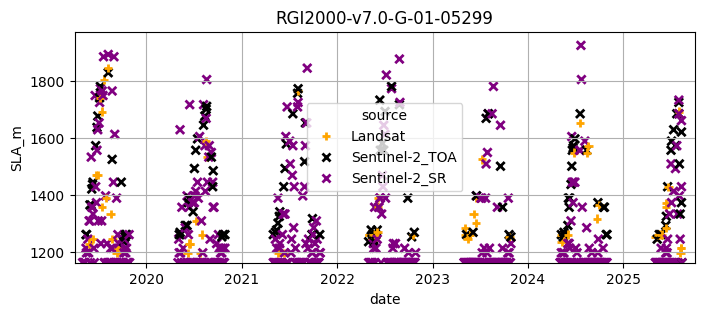


 RGI2000-v7.0-G-01-05740


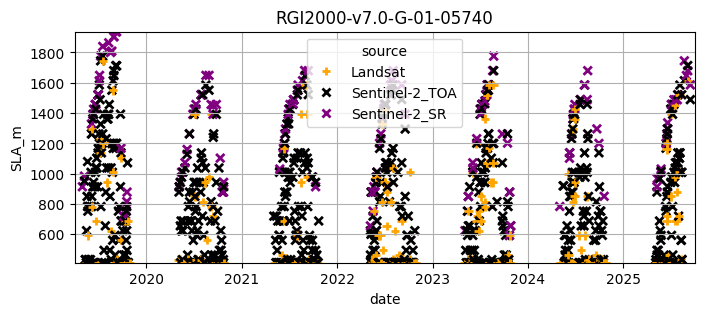


 RGI2000-v7.0-G-01-11350


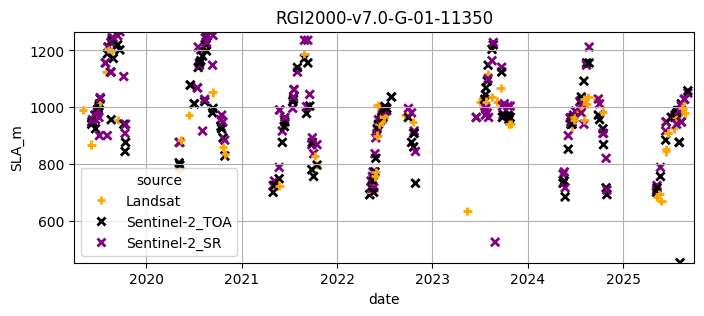


 RGI2000-v7.0-G-01-11947


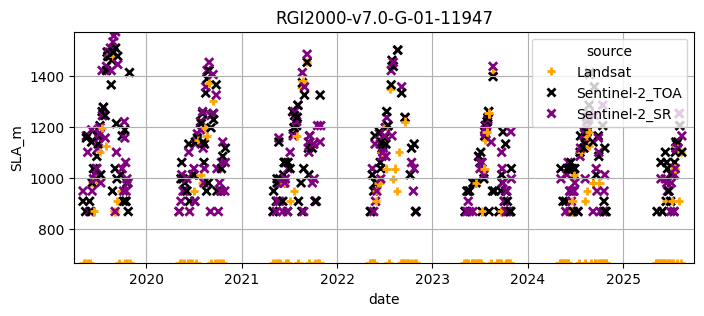


 RGI2000-v7.0-G-01-11961


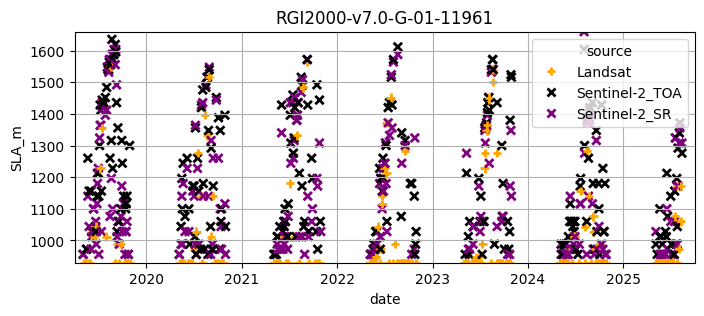


 RGI2000-v7.0-G-01-11967


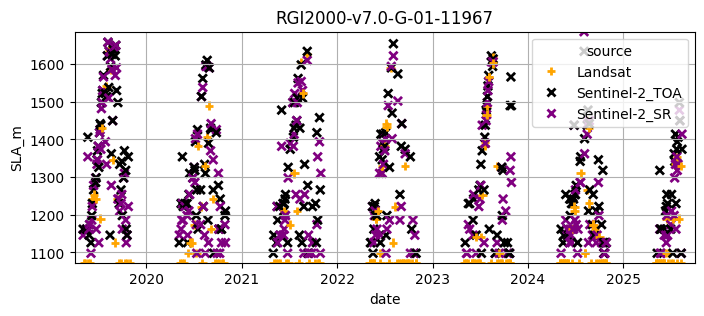


 RGI2000-v7.0-G-01-12394


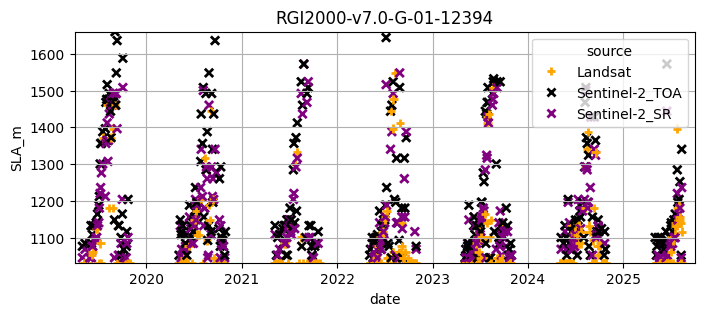


 RGI2000-v7.0-G-01-12405


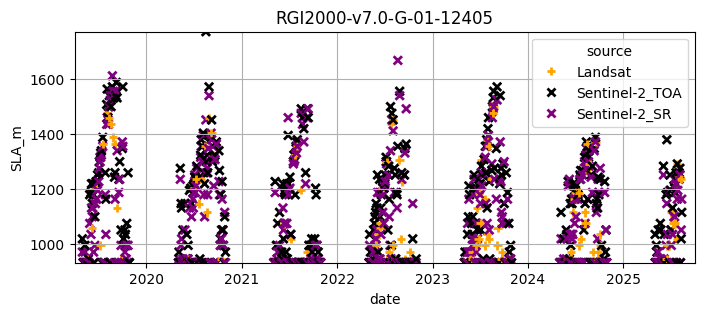


 RGI2000-v7.0-G-01-12416


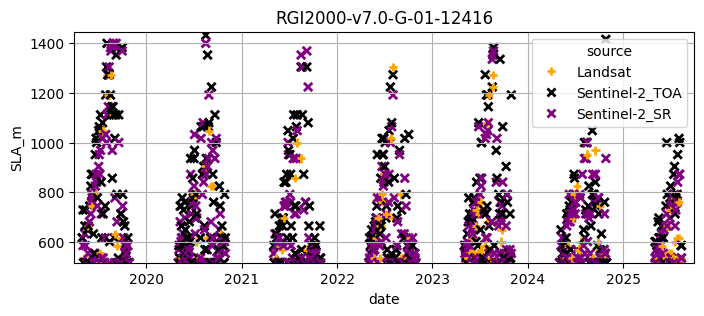


 RGI2000-v7.0-G-01-12420


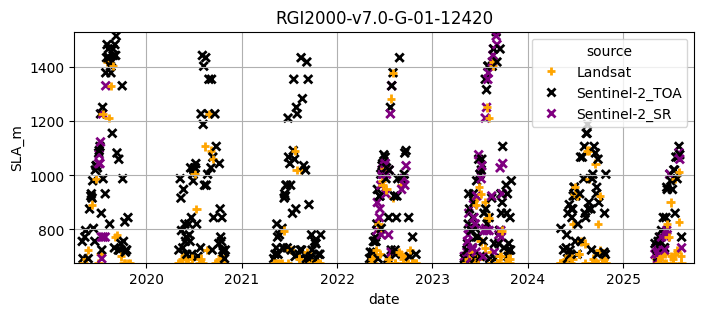


 RGI2000-v7.0-G-01-12440


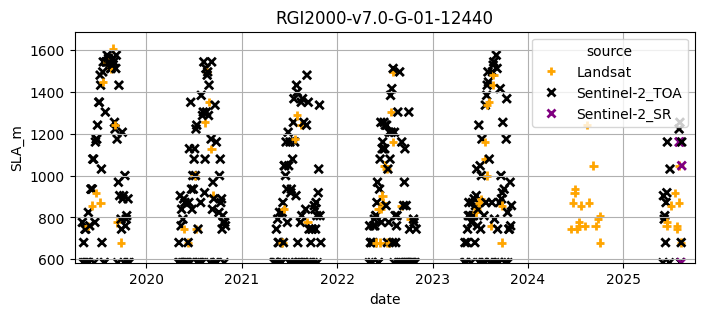


 RGI2000-v7.0-G-01-12441


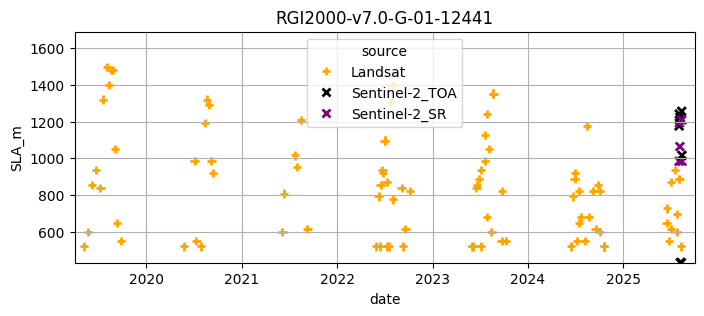


 RGI2000-v7.0-G-01-12610


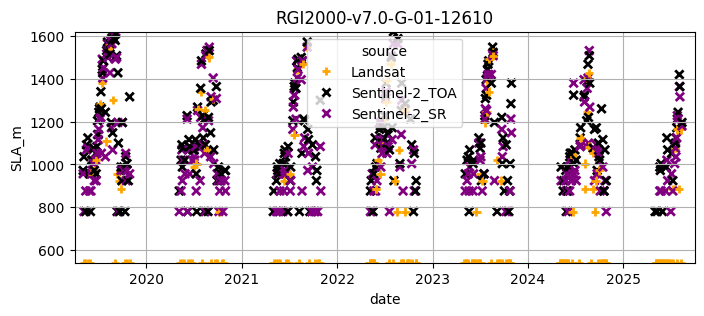


 RGI2000-v7.0-G-01-12626


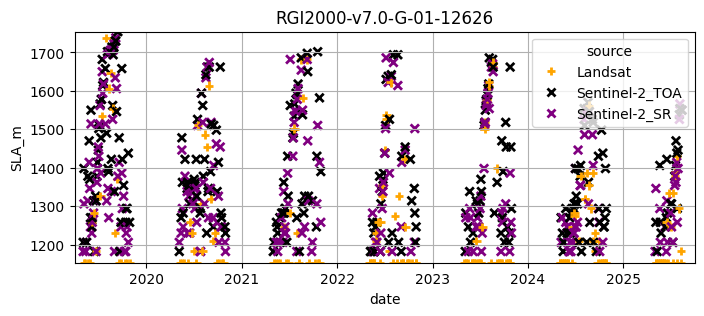


 RGI2000-v7.0-G-01-12741


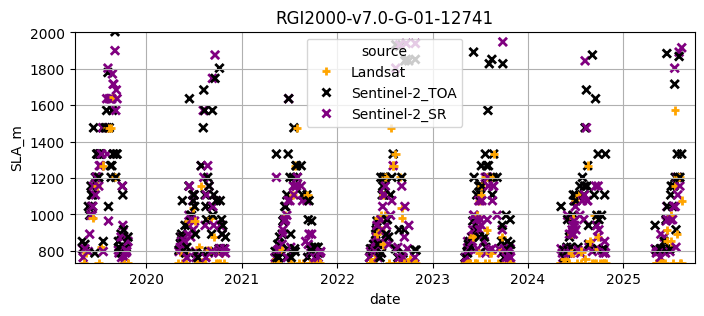


 RGI2000-v7.0-G-01-12890


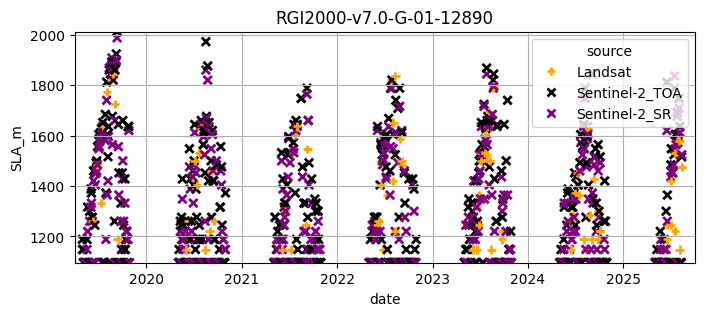


 RGI2000-v7.0-G-01-12946


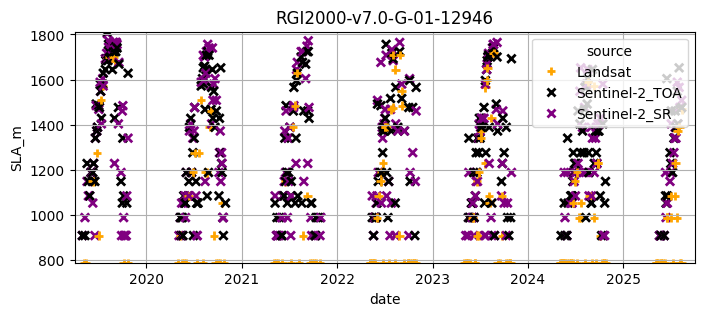


 RGI2000-v7.0-G-01-12947


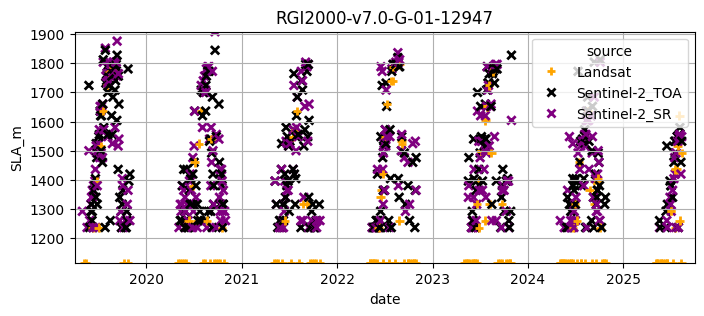


 RGI2000-v7.0-G-01-12954


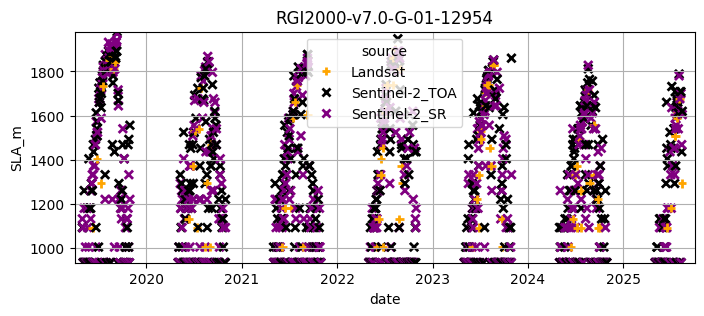


 RGI2000-v7.0-G-01-12972


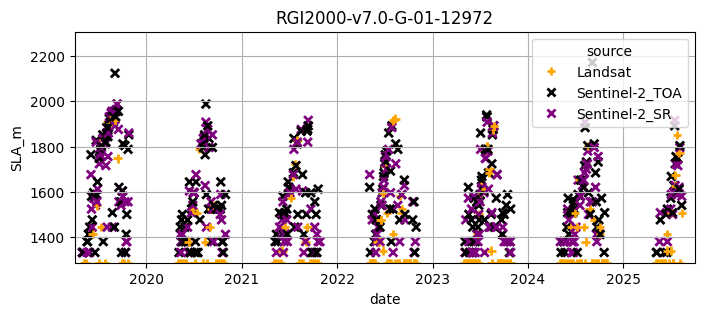


 RGI2000-v7.0-G-01-13061


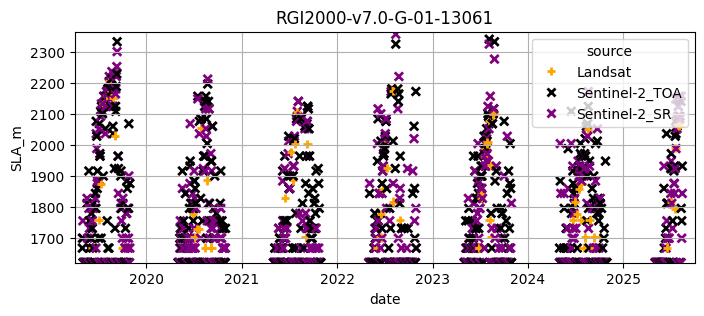


 RGI2000-v7.0-G-01-13089


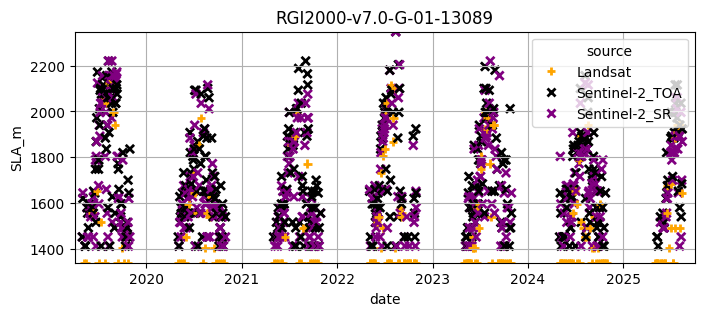


 RGI2000-v7.0-G-01-13322


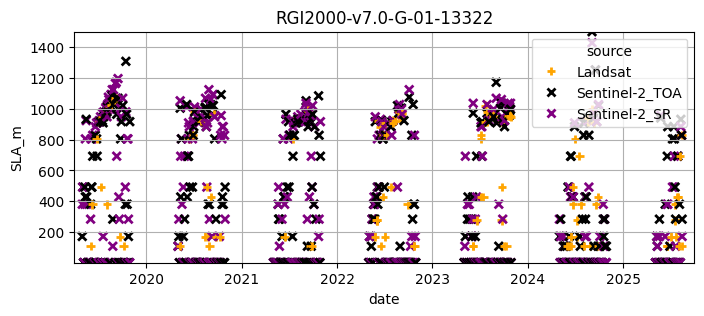


 RGI2000-v7.0-G-01-13325


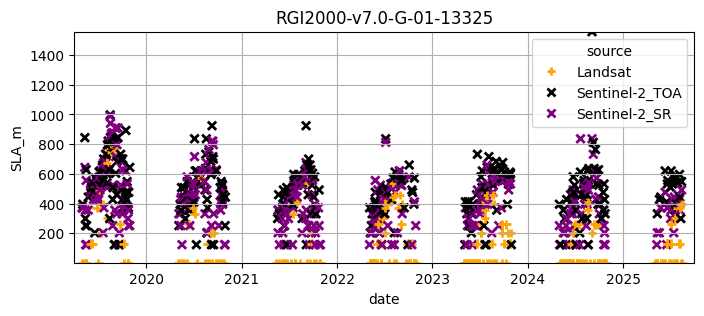


 RGI2000-v7.0-G-01-13343


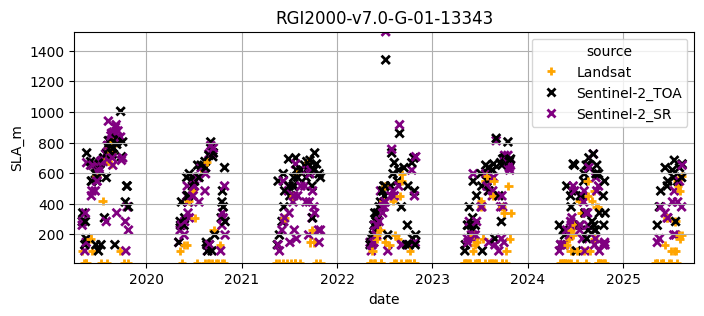


 RGI2000-v7.0-G-01-13344


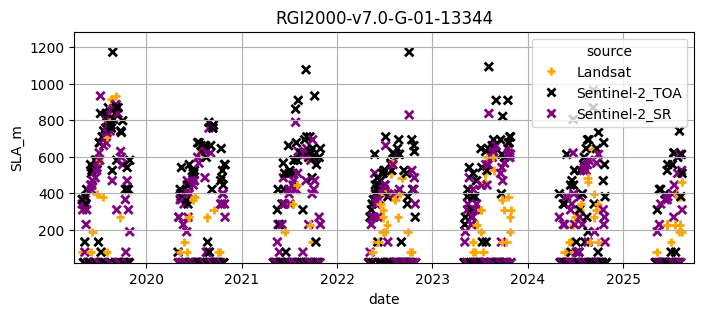


 RGI2000-v7.0-G-01-13418


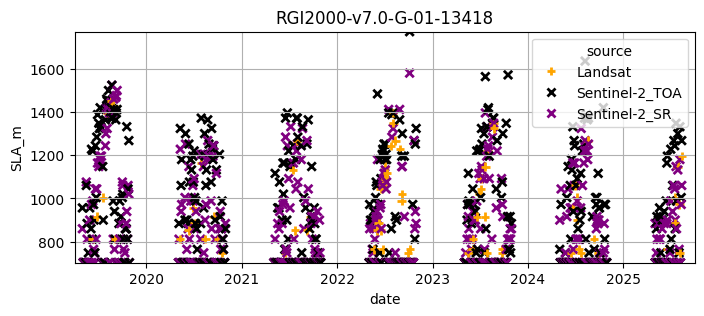


 RGI2000-v7.0-G-01-13420


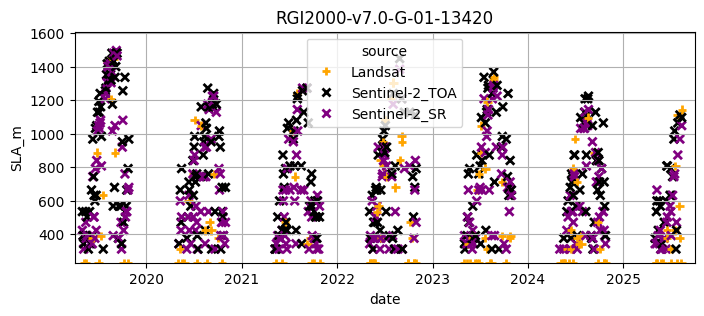


 RGI2000-v7.0-G-01-13431


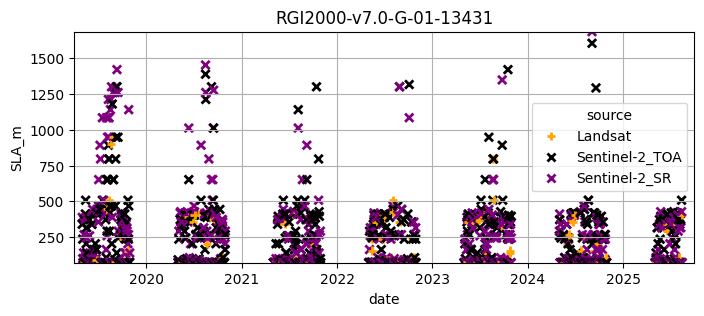


 RGI2000-v7.0-G-01-13587


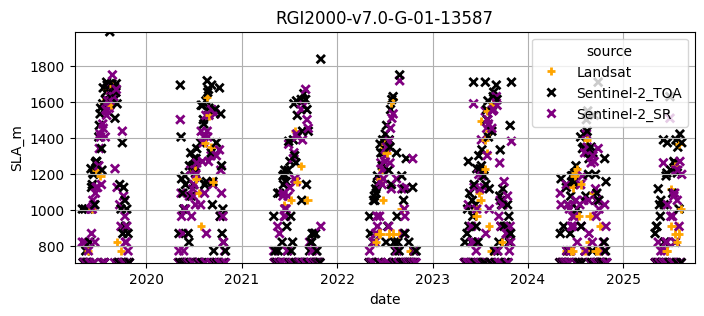


 RGI2000-v7.0-G-01-13661


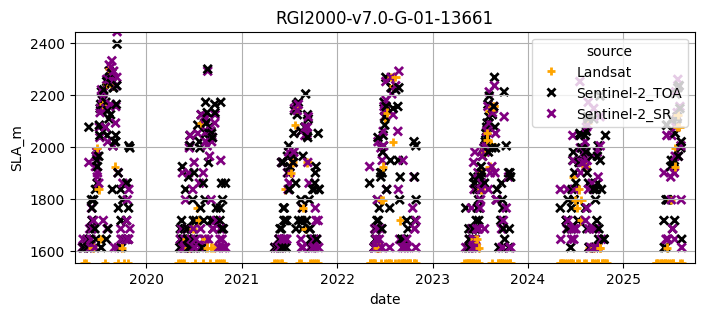


 RGI2000-v7.0-G-01-13683


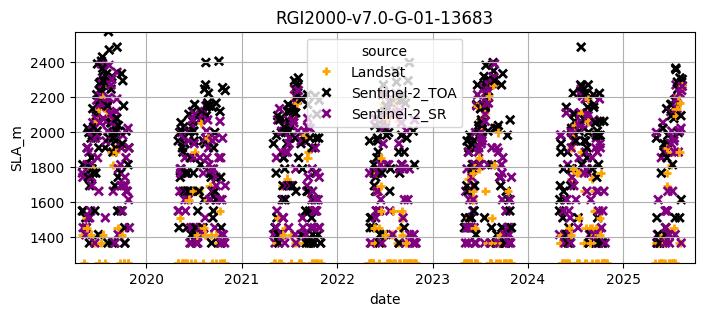


 RGI2000-v7.0-G-01-13712


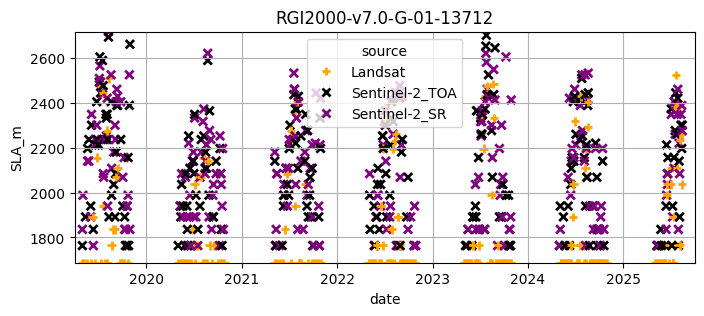


 RGI2000-v7.0-G-01-13930


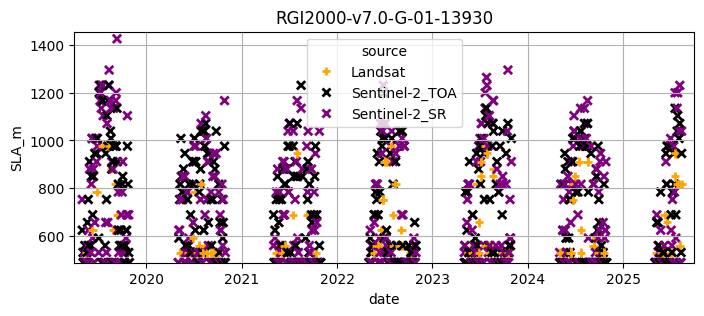


 RGI2000-v7.0-G-01-13956


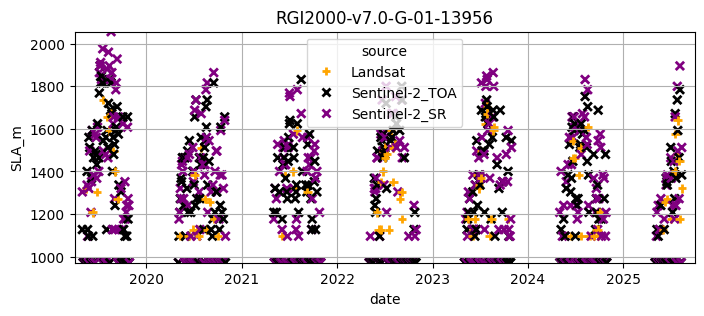


 RGI2000-v7.0-G-01-14080


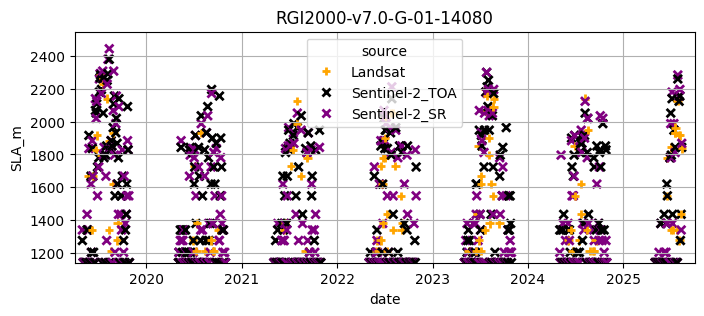


 RGI2000-v7.0-G-01-14183


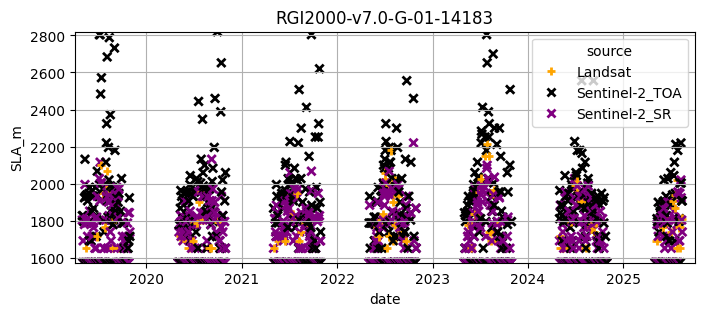


 RGI2000-v7.0-G-01-14203


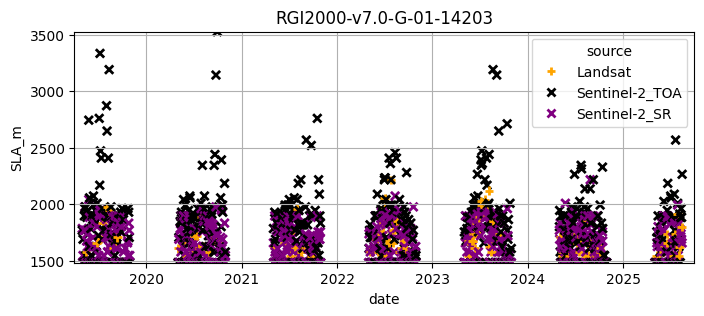


 RGI2000-v7.0-G-01-14218


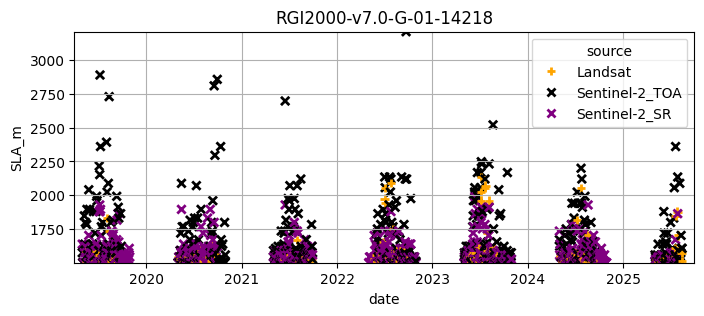


 RGI2000-v7.0-G-01-14275


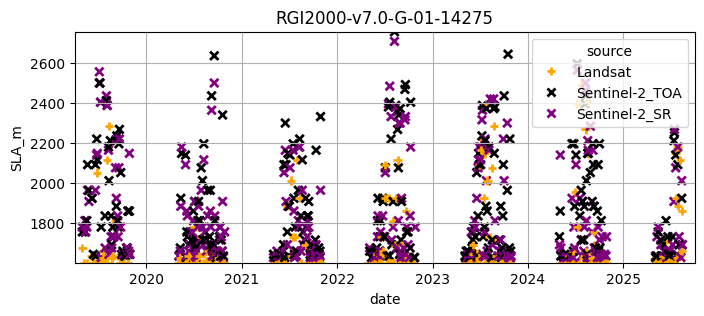


 RGI2000-v7.0-G-01-14292


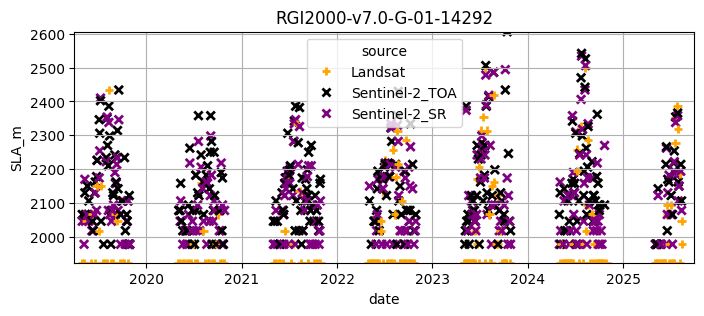


 RGI2000-v7.0-G-01-14306


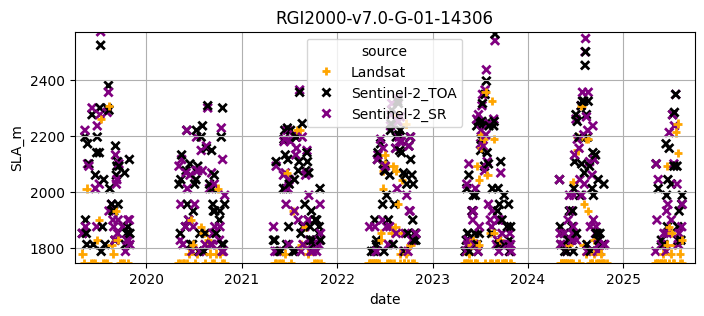


 RGI2000-v7.0-G-01-14374


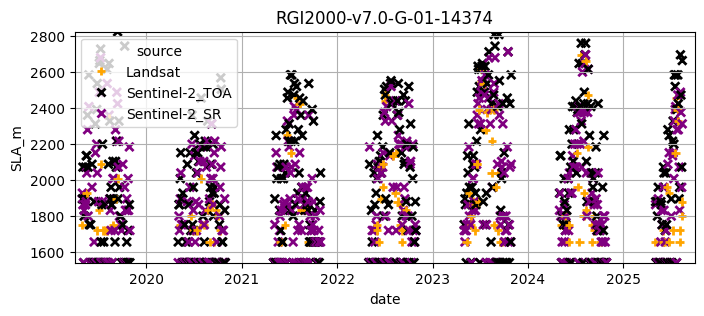


 RGI2000-v7.0-G-01-14417


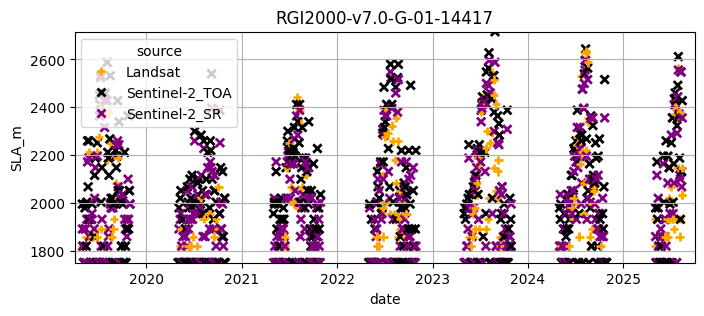


 RGI2000-v7.0-G-01-14426


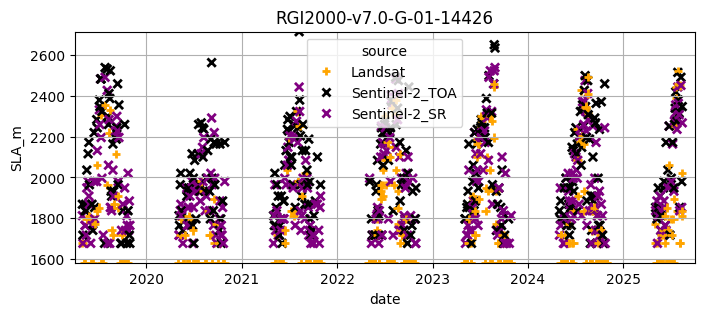


 RGI2000-v7.0-G-01-14454


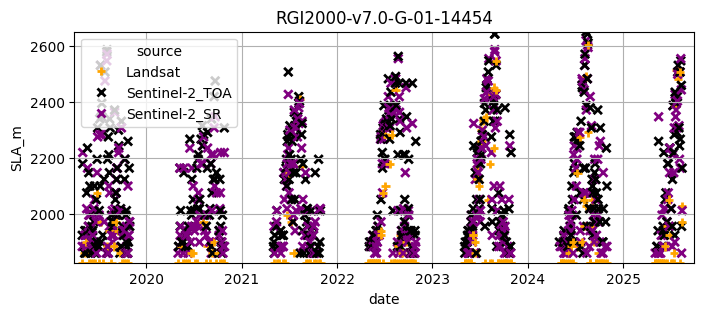


 RGI2000-v7.0-G-01-14469


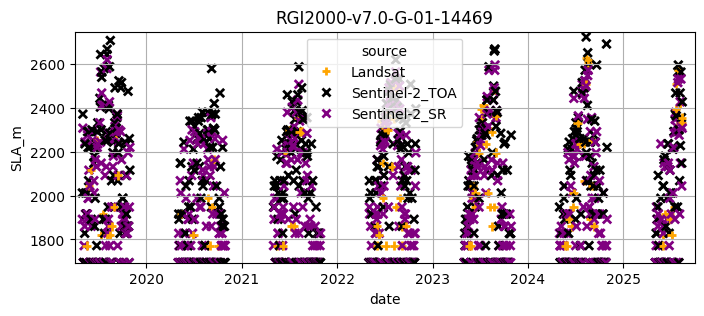


 RGI2000-v7.0-G-01-14490


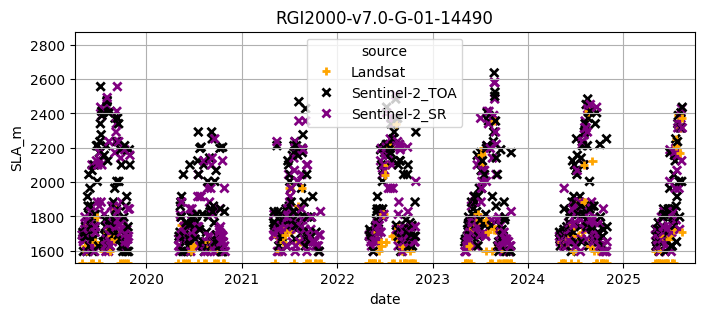


 RGI2000-v7.0-G-01-14515


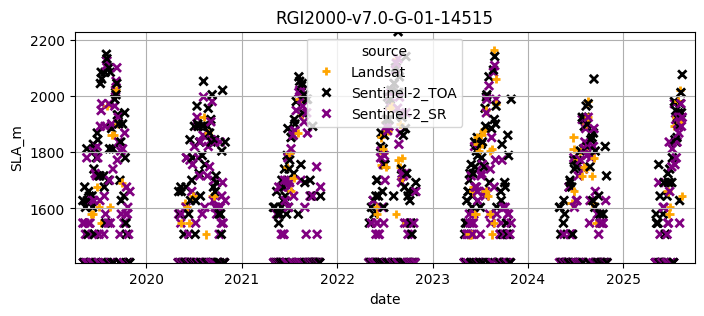


 RGI2000-v7.0-G-01-14521


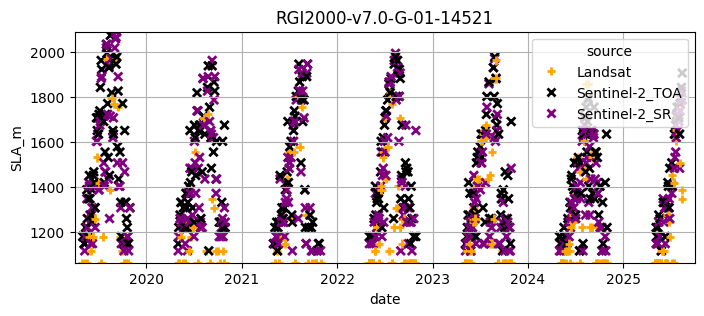


 RGI2000-v7.0-G-01-14614


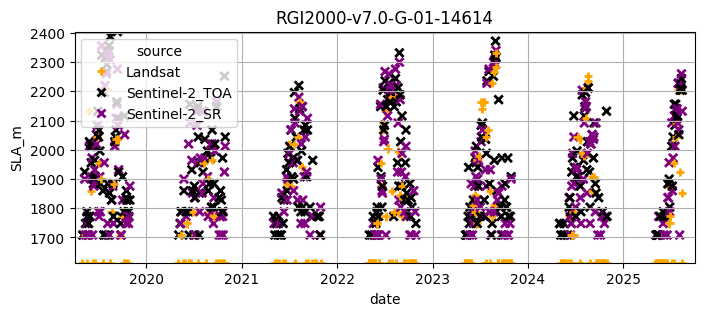


 RGI2000-v7.0-G-01-14623


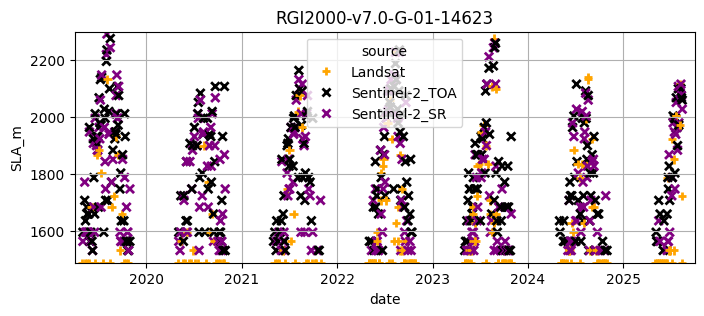


 RGI2000-v7.0-G-01-14632


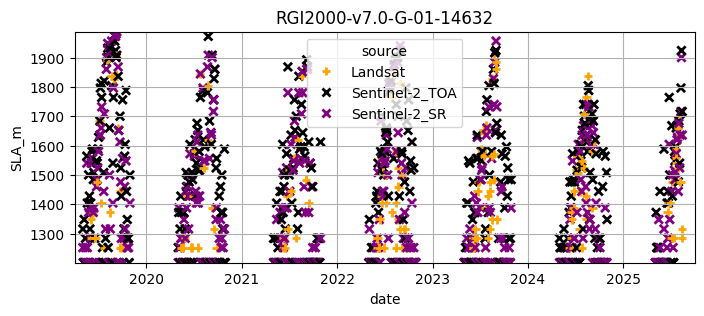


 RGI2000-v7.0-G-01-14684


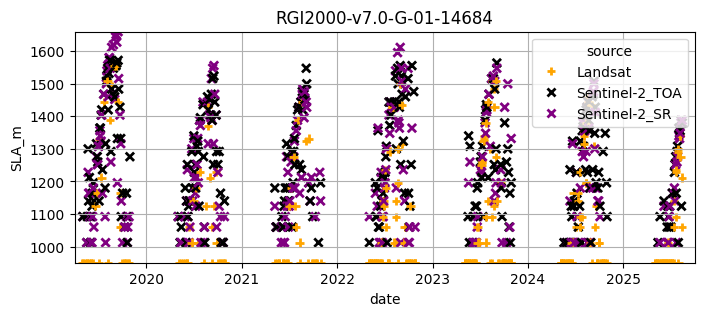


 RGI2000-v7.0-G-01-14769


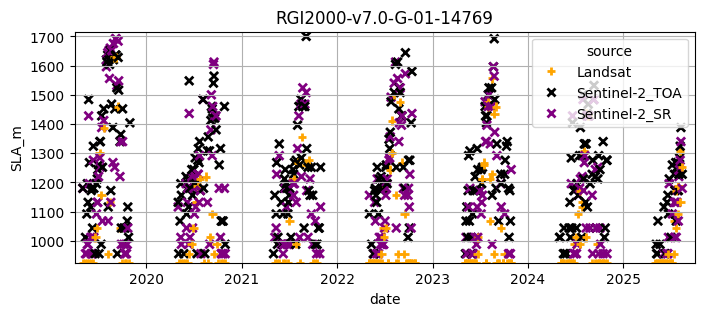


 RGI2000-v7.0-G-01-14773


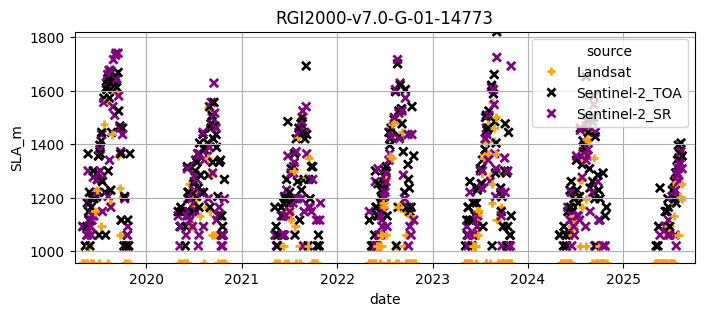


 RGI2000-v7.0-G-01-14939


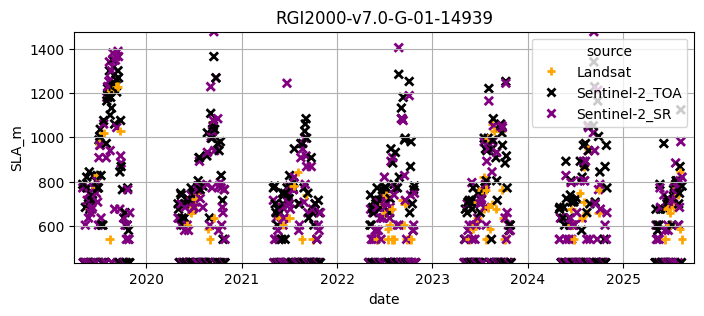


 RGI2000-v7.0-G-01-14962


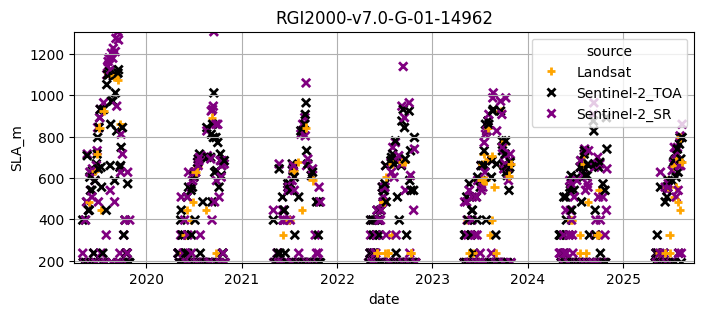


 RGI2000-v7.0-G-01-14970


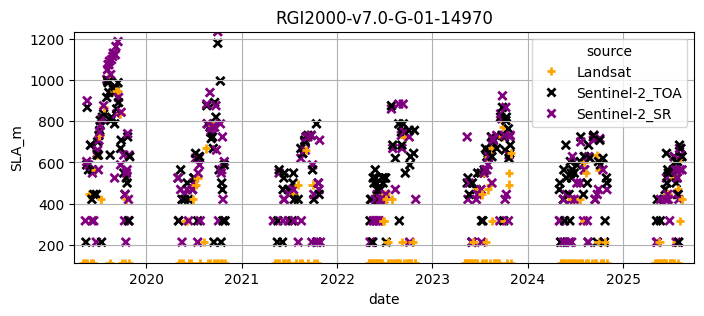


 RGI2000-v7.0-G-01-15002


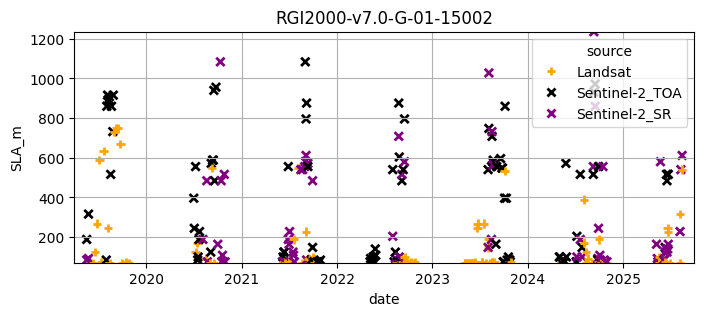


 RGI2000-v7.0-G-01-15008


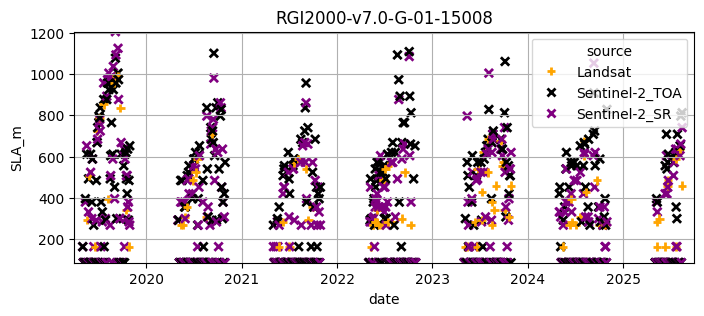


 RGI2000-v7.0-G-01-15025


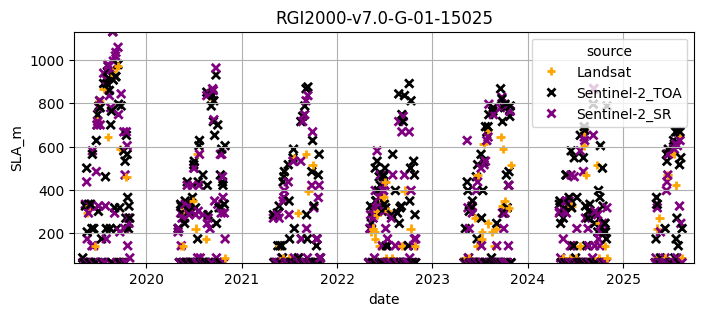


 RGI2000-v7.0-G-01-15106


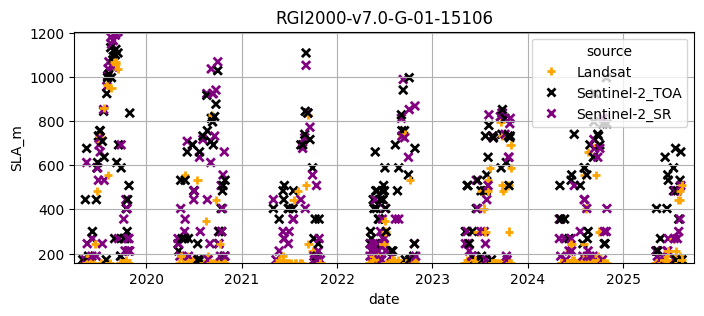


 RGI2000-v7.0-G-01-15127


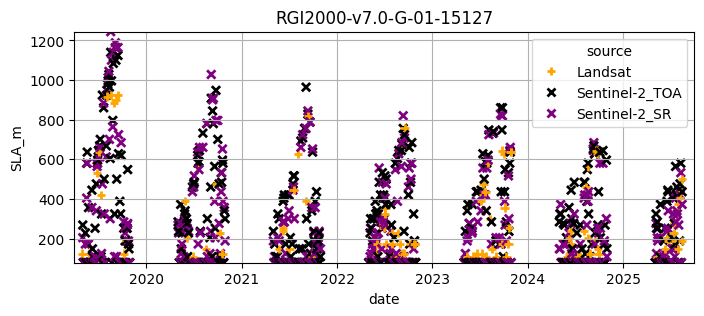


 RGI2000-v7.0-G-01-15207


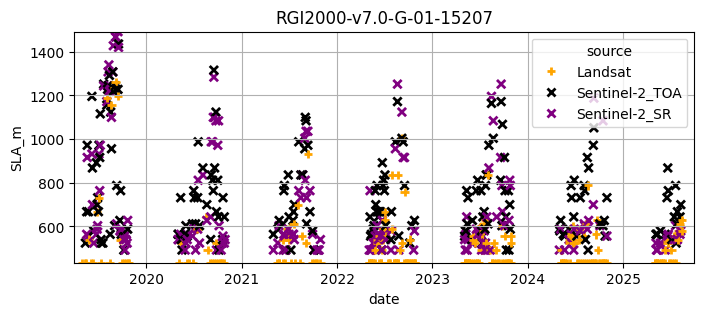


 RGI2000-v7.0-G-01-15219


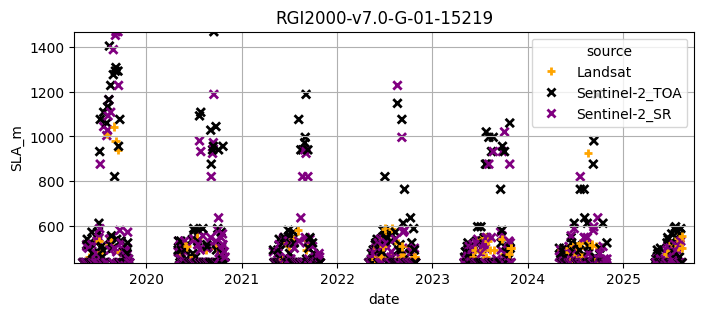


 RGI2000-v7.0-G-01-15220


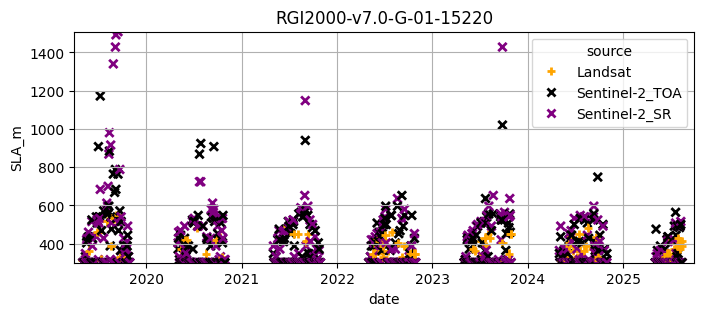


 RGI2000-v7.0-G-01-15228


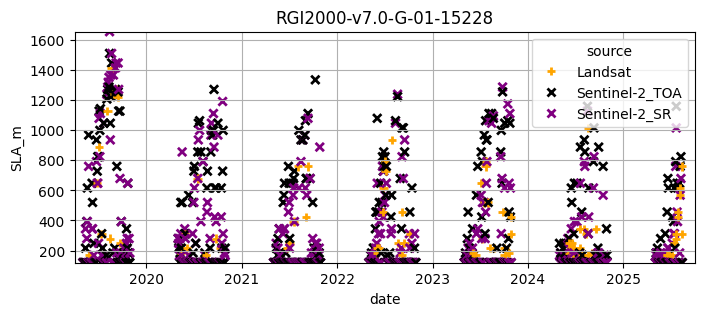


 RGI2000-v7.0-G-01-15290


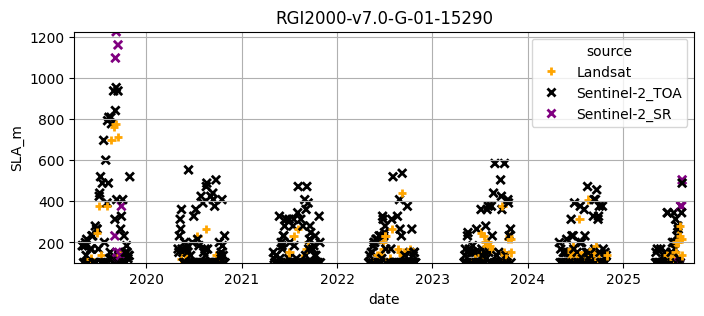


 RGI2000-v7.0-G-01-15295


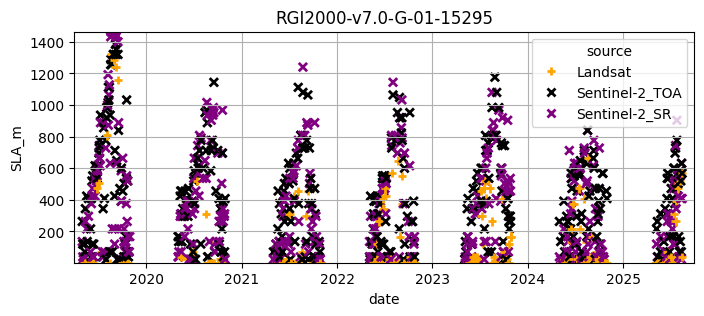


 RGI2000-v7.0-G-01-15309


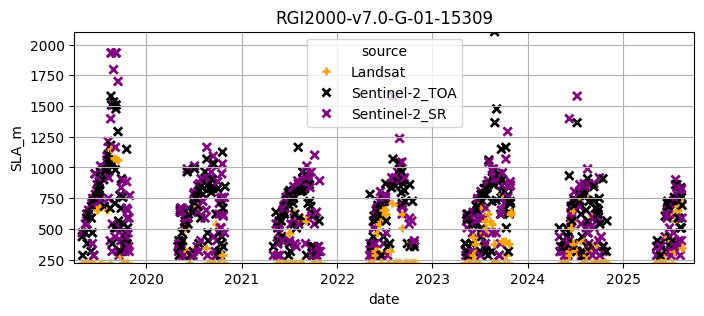


 RGI2000-v7.0-G-01-15336


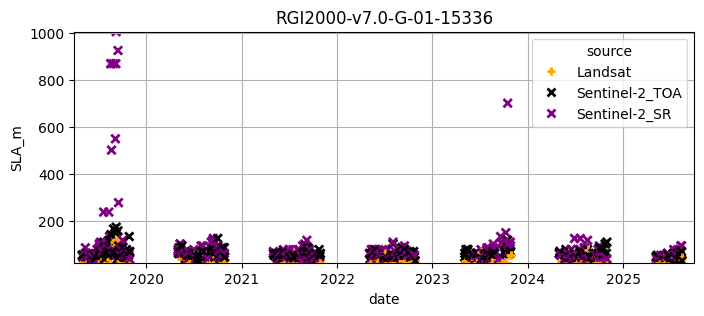


 RGI2000-v7.0-G-01-15373


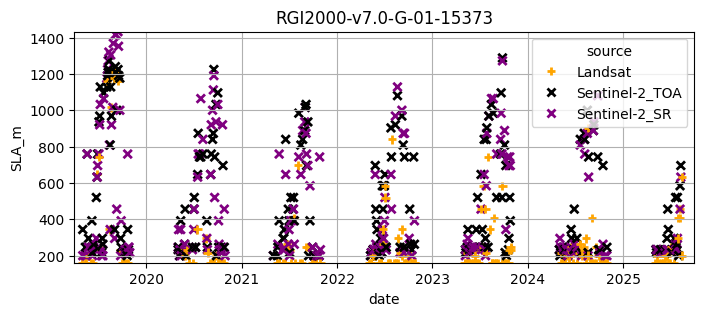


 RGI2000-v7.0-G-01-15524


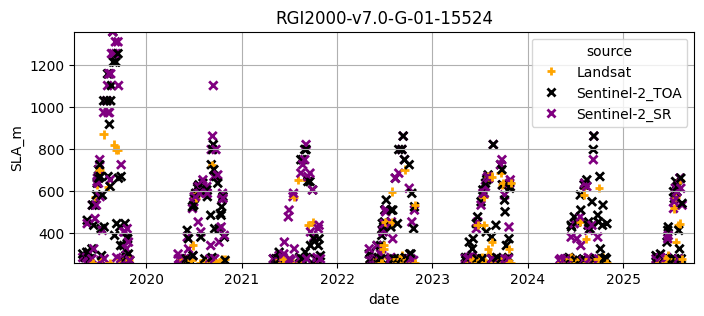


 RGI2000-v7.0-G-01-15552


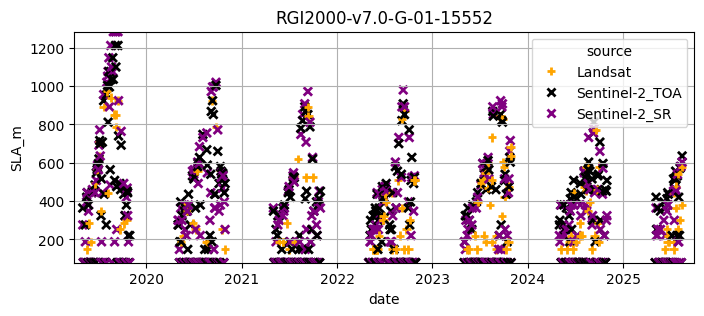


 RGI2000-v7.0-G-01-15557


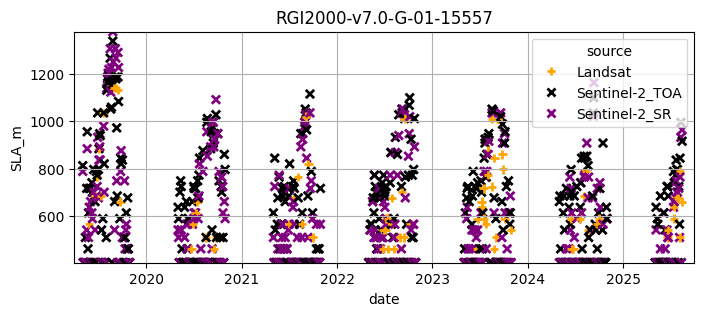


 RGI2000-v7.0-G-01-15658


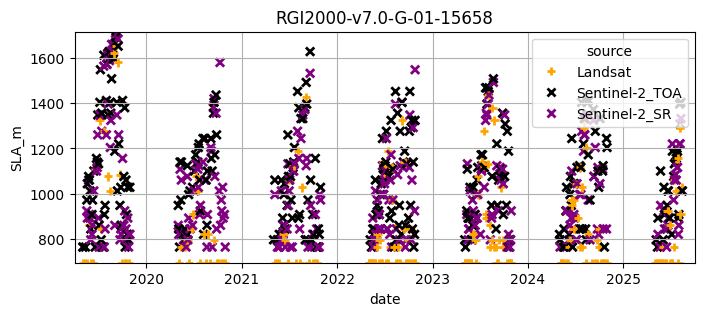


 RGI2000-v7.0-G-01-15664


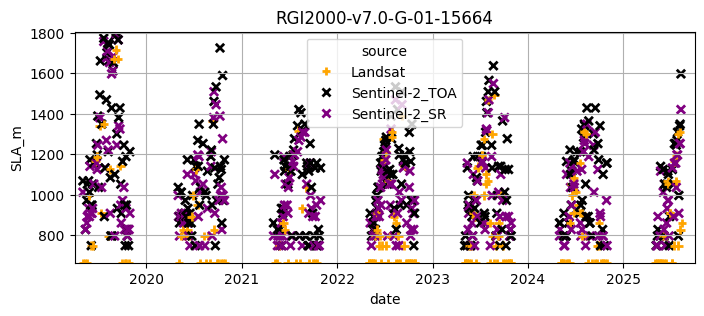


 RGI2000-v7.0-G-01-15668


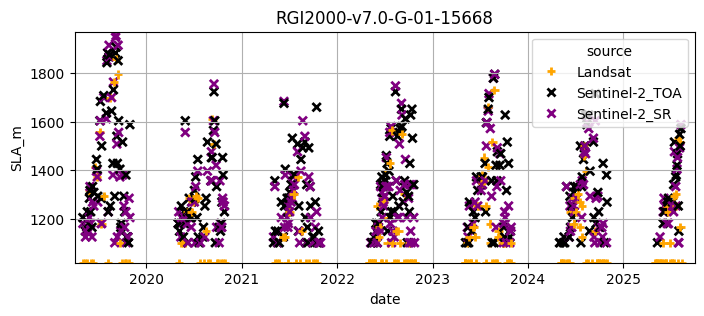


 RGI2000-v7.0-G-01-15697


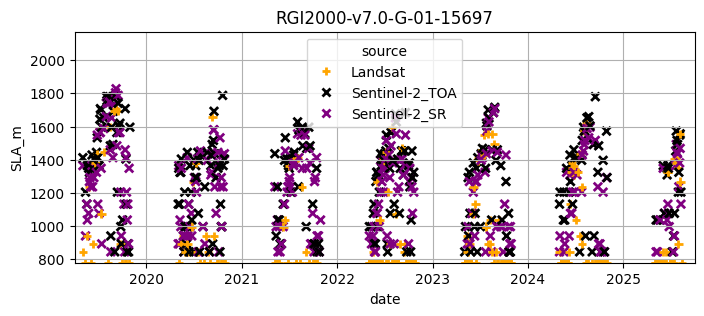


 RGI2000-v7.0-G-01-15706


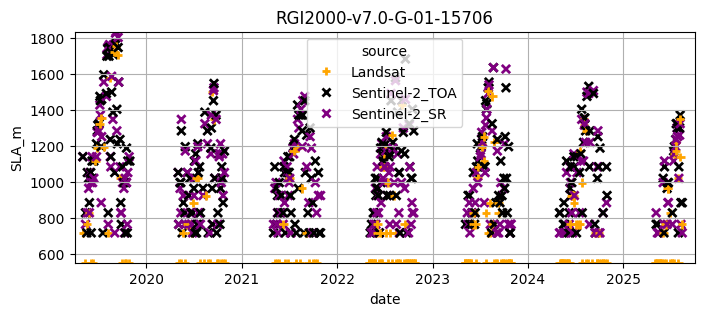


 RGI2000-v7.0-G-01-15771


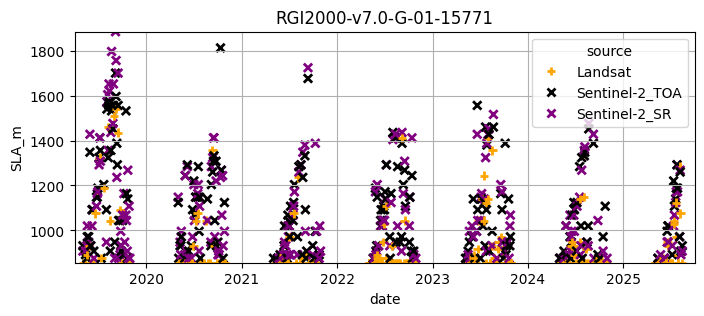


 RGI2000-v7.0-G-01-15797


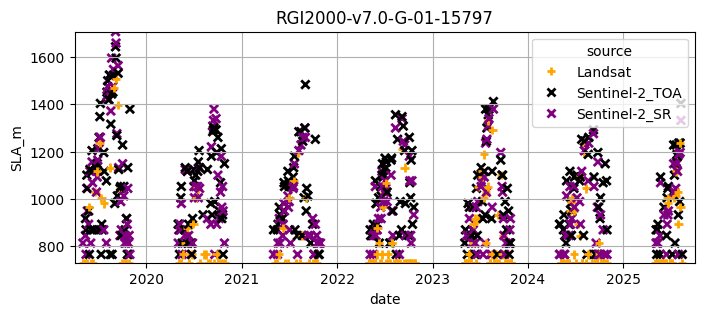


 RGI2000-v7.0-G-01-15798


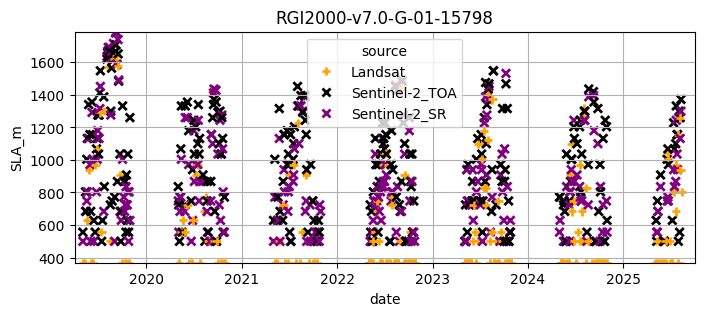


 RGI2000-v7.0-G-01-15809


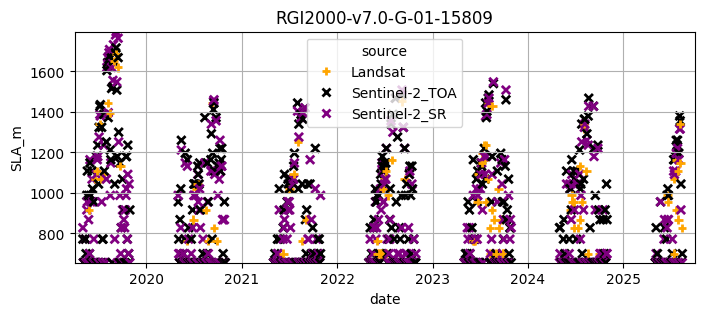


 RGI2000-v7.0-G-01-15845


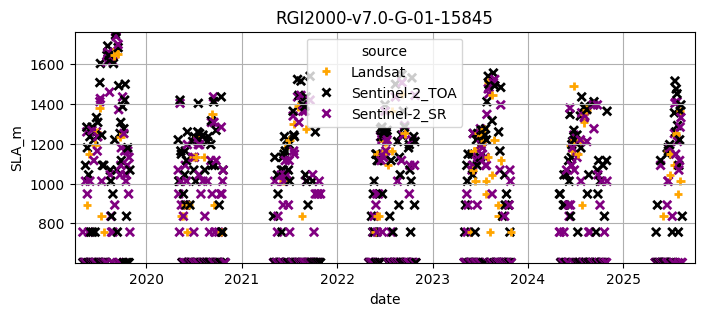


 RGI2000-v7.0-G-01-15851


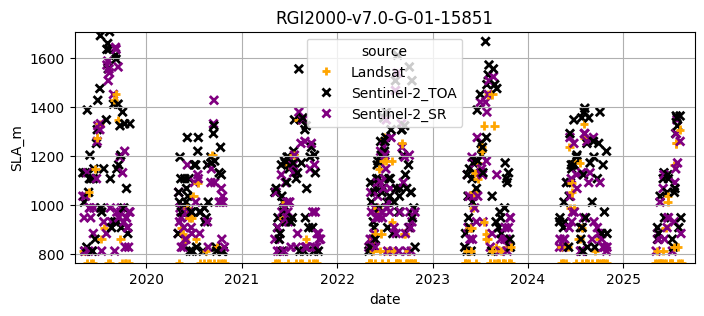


 RGI2000-v7.0-G-01-15862


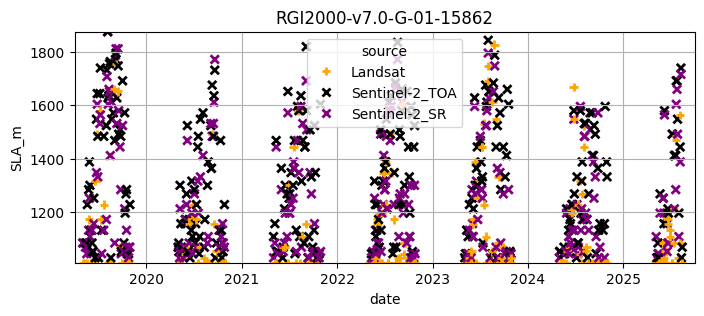


 RGI2000-v7.0-G-01-16138


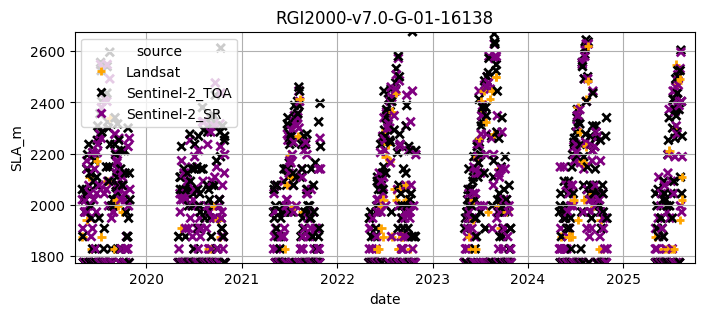


 RGI2000-v7.0-G-01-16198


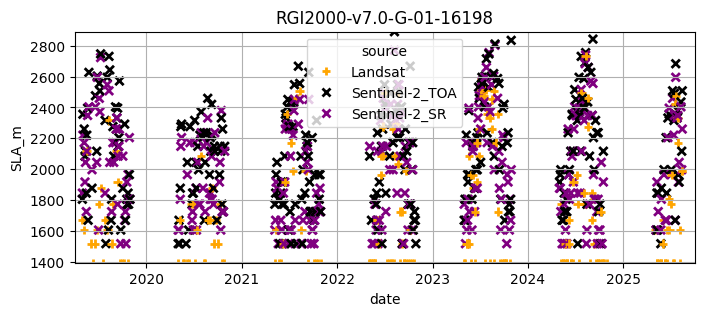


 RGI2000-v7.0-G-01-16233


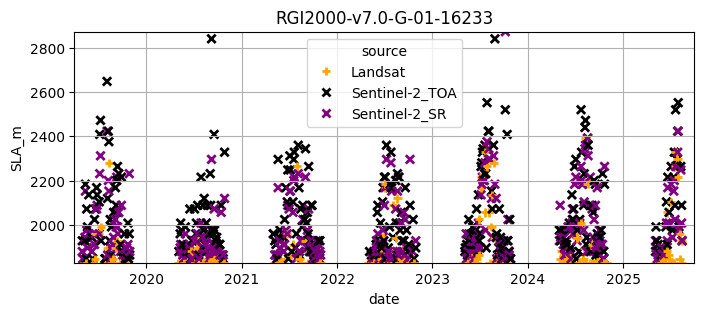


 RGI2000-v7.0-G-01-16250


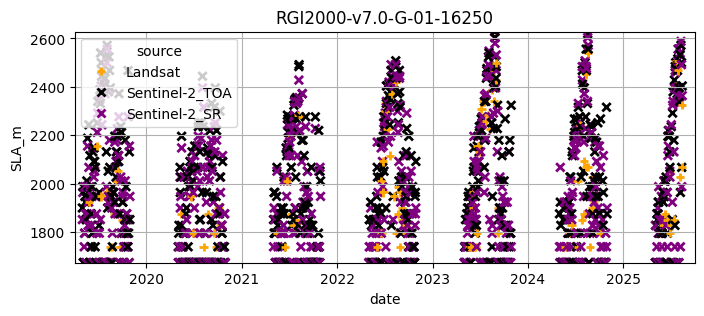


 RGI2000-v7.0-G-01-16302


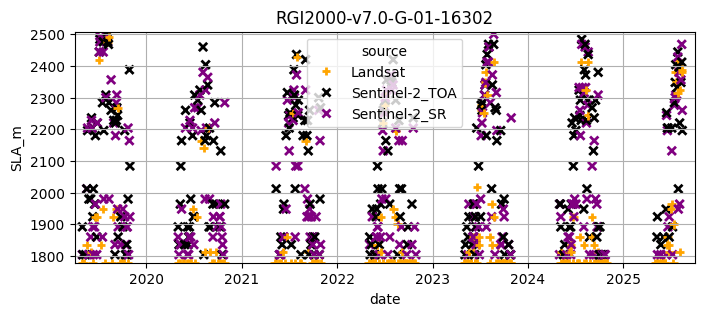


 RGI2000-v7.0-G-01-16327


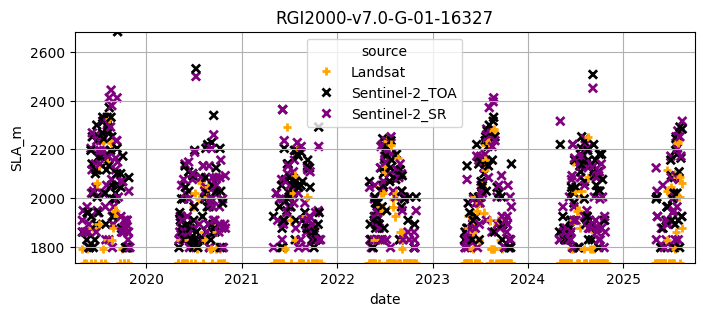


 RGI2000-v7.0-G-01-16351


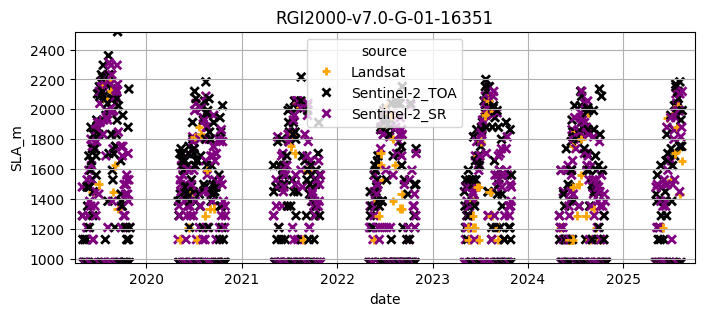


 RGI2000-v7.0-G-01-16413


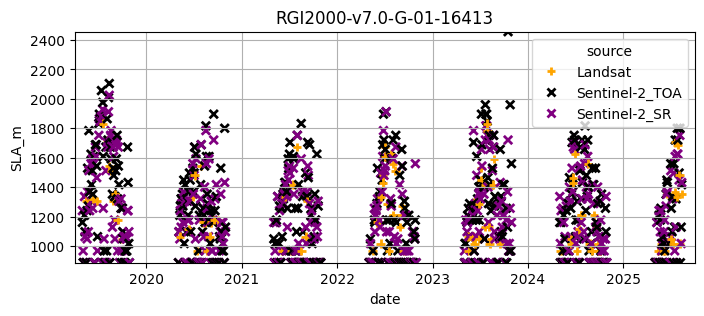


 RGI2000-v7.0-G-01-16420


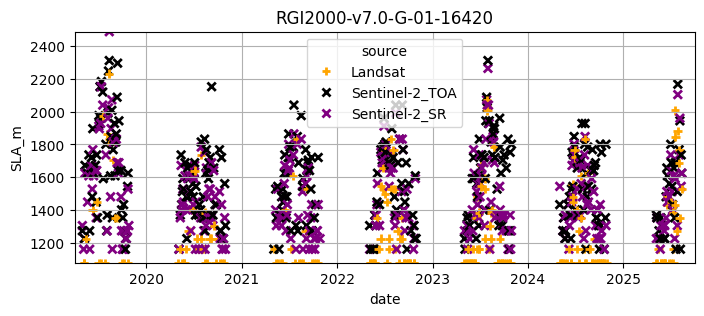


 RGI2000-v7.0-G-01-16457


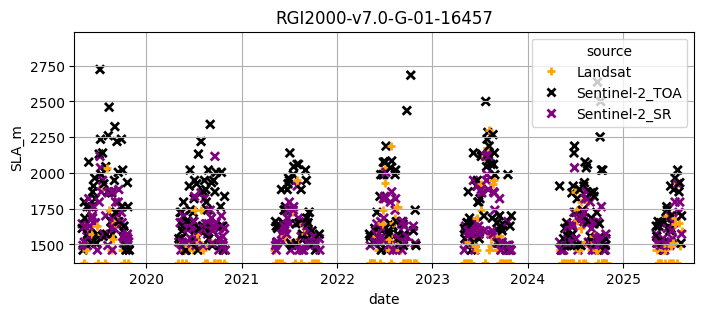


 RGI2000-v7.0-G-01-16691


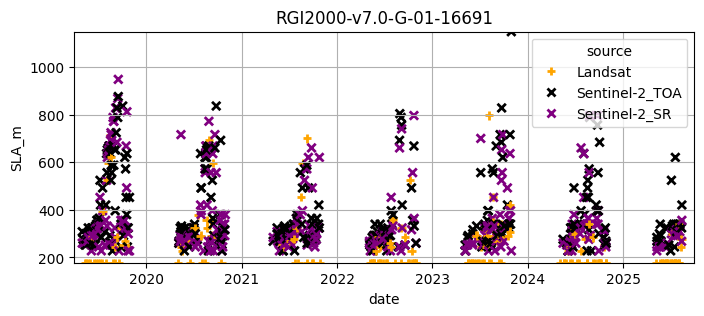


 RGI2000-v7.0-G-01-16701


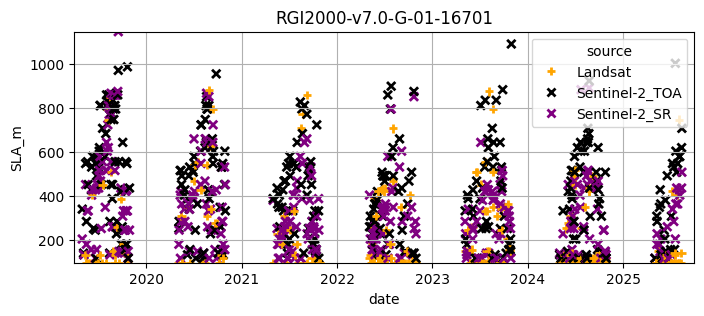


 RGI2000-v7.0-G-01-16707


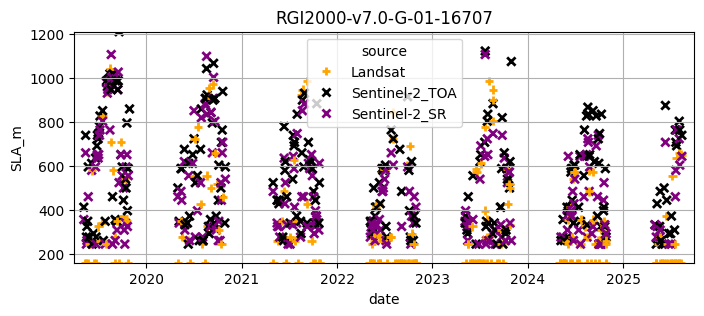


 RGI2000-v7.0-G-01-16735


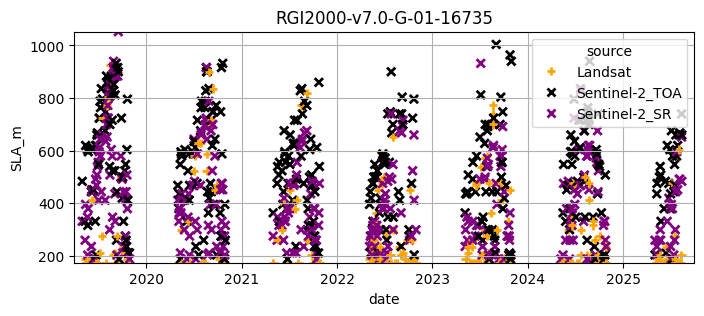


 RGI2000-v7.0-G-01-16755


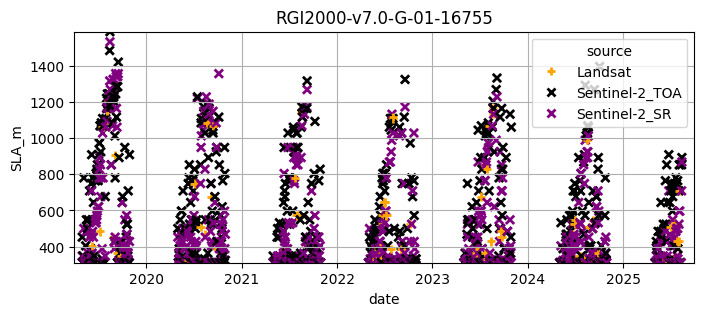


 RGI2000-v7.0-G-01-17516


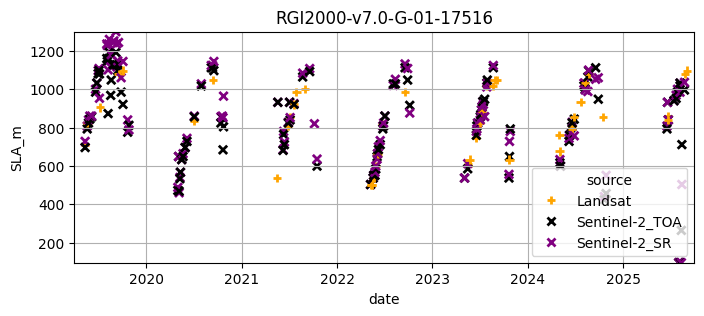

In [ ]:
hue_colors = {'Landsat': 'orange', 'Sentinel-2_SR': 'purple', 'Sentinel-2_TOA': 'black'}

# Iterate over glacier IDs
for glacier_ID in glacier_IDs:
  print('\n', glacier_ID)

  # load compiled time series
  df = pd.read_csv(os.path.join(out_path, glacier_ID + '_snow_timeseries.csv'))
  df['date'] = pd.to_datetime(df['date'])
  # print(df.head())

  # replace the minimum snowline altitude with NaN since it is set as the minimum is it is snow-covered
  df['SLA_m'] = df['SLA_m'].replace(df['SLA_m'].min(), np.nan)

  # # plot
  fig, ax = plt.subplots(figsize=(8,3))
  sns.scatterplot(df, x='date', y='SLA_m', hue='source', palette=hue_colors,
                  sizes=10, style='source', markers = ['+','x','x'], linewidth=2, ax=ax)
  ax.set_title(glacier_ID)
  ax.set_ylim(df['SLA_m'].min(),df['SLA_m'].max())
  ax.set_xlim(pd.to_datetime('20190401'),pd.to_datetime('20250930')) #data from as early as 2013 but focus on post-Sentinel launch
  plt.grid()
  plt.show()
